In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd
import cv2
import matplotlib.pyplot as plt

from glob import glob

import IPython.display as ipd
from tqdm.notebook import tqdm
import subprocess
# data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [ ]:
input_file="/kaggle/input/driving-video-with-object-tracking/bdd100k_videos_train_00/bdd100k/videos/train/026c7465-309f6d33.mov"
subprocess.run(['ffmpeg','-i',input_file,'-qscale','0','026c7465-309f6d33.mp4'])

In [3]:
ipd.Video('026c7465-309f6d33.mp4',width=700)

In [4]:
#opening the video and read metsdata
cap=cv2.VideoCapture('026c7465-309f6d33.mp4')# loading the video

In [5]:
# total number of frames in video
cap.get(cv2.CAP_PROP_FRAME_COUNT)


2398.0

In [6]:
# taking out height and width of the video
height=cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
width=cap.get(cv2.CAP_PROP_FRAME_WIDTH)
print(f'height  {height}  ,width  {width}')


height  720.0  ,width  1280.0


In [7]:
fps=cap.get(cv2.CAP_PROP_FPS)
print(fps)

59.94005994005994


In [8]:
cap.release()

In [9]:
#pulling the first image form the video
cap=cv2.VideoCapture('026c7465-309f6d33.mp4')
ret,img=cap.read()
print(f'Returned{ret} and img of shape {img.shape}')

ReturnedTrue and img of shape (720, 1280, 3)


In [10]:
#taeking look at image
img.shape

(720, 1280, 3)

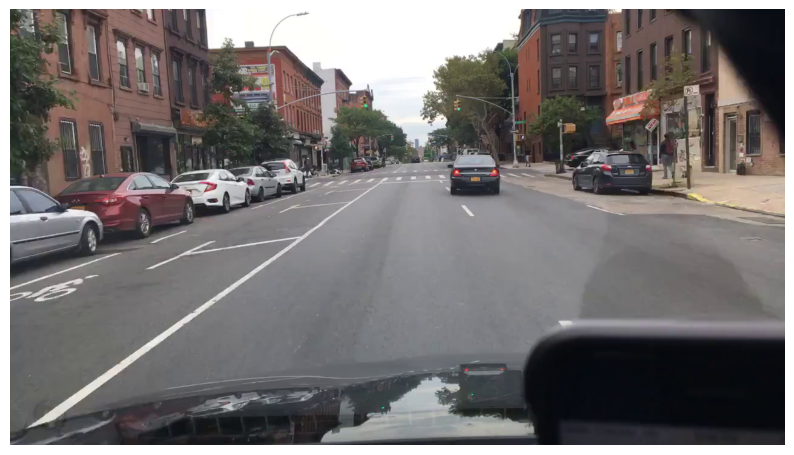

In [11]:
# converting the image from bgr to rgb format 
def display_cv2_img(img,figsize=(10,10)):
    img_=cv2.cvtColor(img , cv2.COLOR_BGR2RGB)
    fig , ax =plt.subplots(figsize=figsize)
    ax.imshow(img_)
    ax.axis('off')
    
display_cv2_img(img)

In [12]:
# now again releadsing it
cap.release()

Total frames in the video: 2398


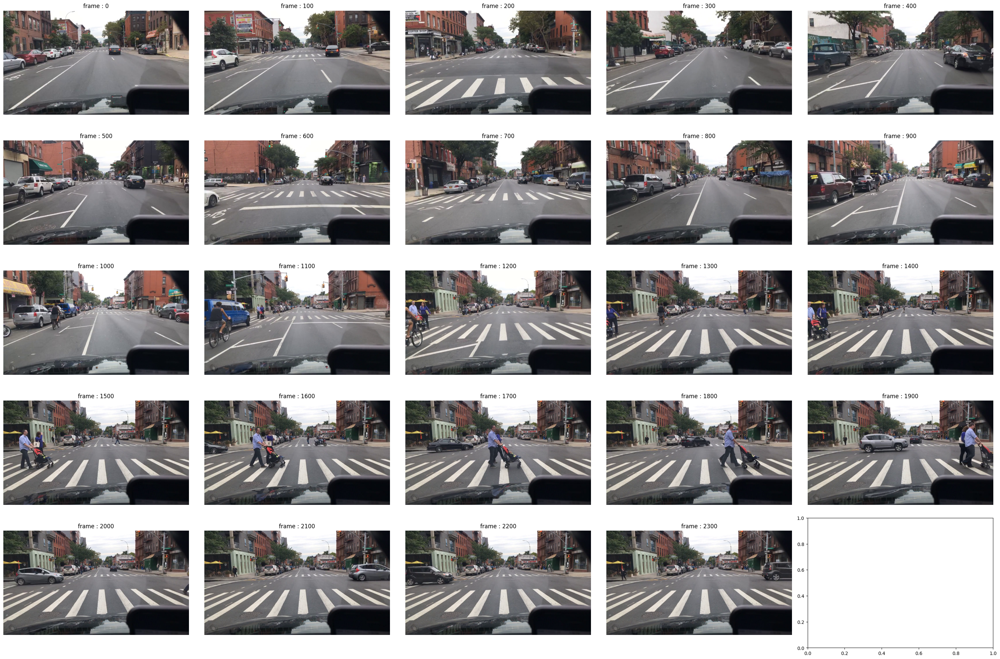

In [13]:
import cv2
import matplotlib.pyplot as plt

# Open the video file
cap = cv2.VideoCapture('026c7465-309f6d33.mp4')

# Get the total number of frames
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
print("Total frames in the video:", n_frames)

# Initialize an empty list to store frames
frames = []

# Read and store every 100th frame
for i in range(n_frames):
    ret, img = cap.read()  # Read the frame
    if not ret:
        print("Failed to read frame", i)
        break
    if i % 100 == 0:
        frames.append(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

# Close the video file
cap.release()

# Display the stored frames
fig, axs = plt.subplots(5, 5, figsize=(30, 20))
axs = axs.flatten()

for i in range(min(len(frames), 25)):
    axs[i].imshow(frames[i])
    axs[i].set_title(f'frame : {i * 100}')
    axs[i].axis('off')

plt.tight_layout()
plt.show()


In [14]:
# #adding annotation to video images
labels=pd.read_csv("/kaggle/input/driving-video-with-object-tracking/mot_labels.csv",
                   low_memory=False)

video_labels=(
    labels.query('videoName=="026c7465-309f6d33"').reset_index(drop=True).copy()
             )

# to make the annotation at same pace 
video_labels["video_frame"]=(video_labels["frameIndex"]*11.9).round().astype("int")

In [15]:
video_labels["category"].value_counts()

category
car              3030
pedestrian        847
bicycle           381
rider             320
truck             194
other vehicle     115
bus               109
other person       74
motorcycle         67
trailer            34
Name: count, dtype: int64

In [16]:
# ploting these labels on teh image with most of the tuings in it 
# pulling the image 1035

cap = cv2.VideoCapture('026c7465-309f6d33.mp4')
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx=0
for frame in range(n_frames):
    ret,img=cap.read()
    if ret==False:
        break
    if frame==1035:
        break
cap.release()



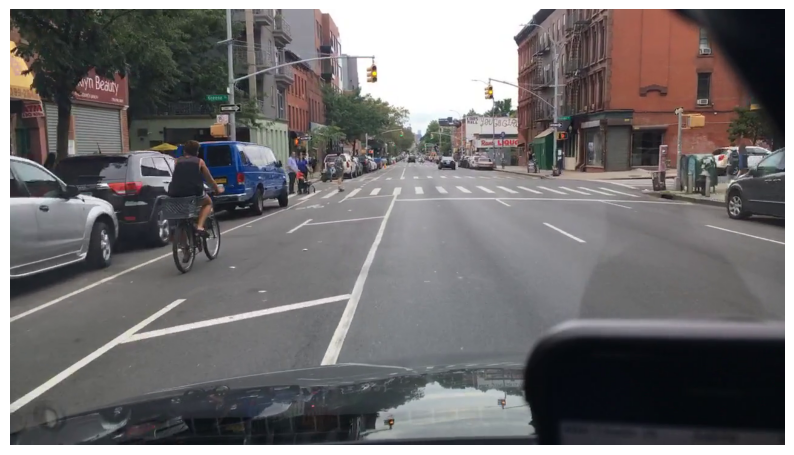

In [17]:
display_cv2_img(img)

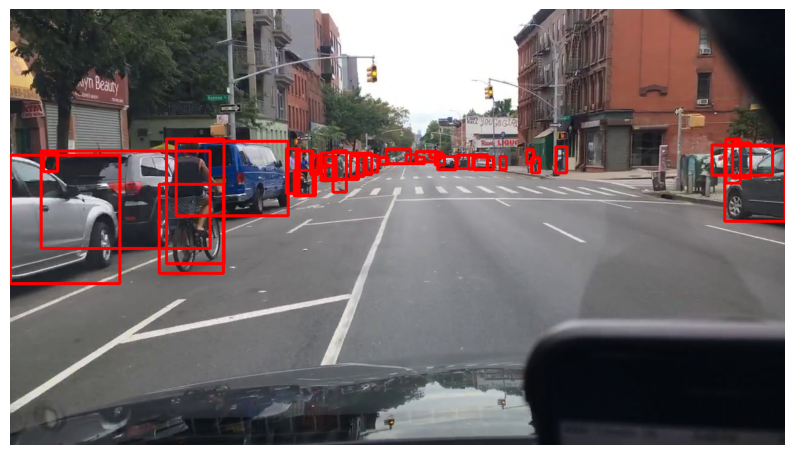

In [18]:
frame_labels=video_labels.query('video_frame==1035')
for i,d in frame_labels.iterrows():
    pt1 = int(d['box2d.x1']),int(d['box2d.y1'])
    pt2 = int(d['box2d.x2']),int(d['box2d.y2'])
    cv2.rectangle(img,pt1,pt2,(0,0,255),3)
    
display_cv2_img(img)

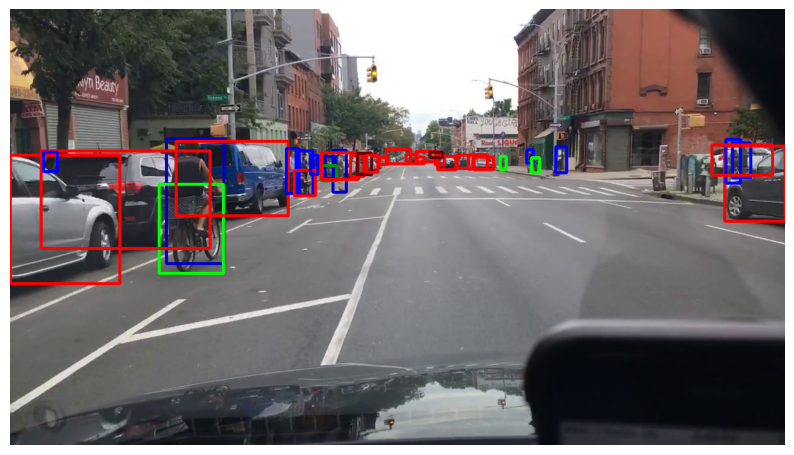

In [19]:
color_map={
    "car":(0,0,255),
    "truck":(0,0,100),
    "pedestrian":(255,0,0),
    "other vehicle":(0,0,255),
    "rider":(200,0,0),
    "bicycle":(0,255,0),
    "other person":(200,0,0),
    "trailer":(0,150,150),
    "motorcycle":(0,150,0),
    "bus":(0,0,100)
}
frame_labels=video_labels.query('video_frame==1035')
for i,d in frame_labels.iterrows():
    pt1 = int(d['box2d.x1']),int(d['box2d.y1'])
    pt2 = int(d['box2d.x2']),int(d['box2d.y2'])
    color=color_map[d['category']]
    cv2.rectangle(img,pt1,pt2,color,3)
    
display_cv2_img(img)

In [20]:
#label and output anonotated video

def add_annotations(img,frame,video_labels):
    max_frame=video_labels.query("video_frame<= @frame")["video_frame"].max()
    frame_labels=video_labels.query("video_frame==@max_frame")
    for i,d in frame_labels.iterrows():
        pt1 = int(d['box2d.x1']),int(d['box2d.y1'])
        pt2 = int(d['box2d.x2']),int(d['box2d.y2'])
        color=color_map[d['category']]
        cv2.rectangle(img,pt1,pt2,color,3)
    return img


In [21]:
cap.release()

In [22]:
VIDEO_CODEC="MP4V"
fps=59.94
width=1280
height=720
out=cv2.VideoWriter("out_test.mp4",
               cv2.VideoWriter_fourcc(*VIDEO_CODEC),
               fps,(width,height))
cap=cv2.VideoCapture("026c7465-309f6d33.mp4")
n_frames=int(cap.get(cv2.CAP_PROP_FRAME_COUNT))



for frame in tqdm(range(n_frames)):
    ret,img =cap.read()
    if ret ==False:
        break
    img=add_annotations(img,frame,video_labels)
    out.write(img)
    
out.release()
cap.release()

OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'


  0%|          | 0/2398 [00:00<?, ?it/s]

In [23]:
!ls -GFlash -color

total 85M
 72M -rw-r--r-- 1 root  72M Apr 23 04:42 out_test.mp4
 14M -rw-r--r-- 1 root  14M Apr 23 04:39 026c7465-309f6d33.mp4
4.0K drwxr-xr-x 2 root 4.0K Apr 23 04:38 .virtual_documents/
4.0K drwxr-xr-x 5 root 4.0K Apr 23 04:38 ../
4.0K drwxr-xr-x 3 root 4.0K Apr 23 04:41 ./


In [24]:
tmp_output_path="out_test.mp4"
output_path="out_test_compressed.mp4"
subprocess.run(
[
    "ffmpeg",
    "-i",
    tmp_output_path,
    "-crf",
    "18",
    "-preset",
    "veryfast",
    "-vcodec",
    "libx264",
    output_path,
    "-loglevel",
    "quiet"
])

CompletedProcess(args=['ffmpeg', '-i', 'out_test.mp4', '-crf', '18', '-preset', 'veryfast', '-vcodec', 'libx264', 'out_test_compressed.mp4', '-loglevel', 'quiet'], returncode=0)

In [25]:
!ls -GFlash -color

total 114M
 29M -rw-r--r-- 1 root  29M Apr 23 04:43 out_test_compressed.mp4
 72M -rw-r--r-- 1 root  72M Apr 23 04:42 out_test.mp4
 14M -rw-r--r-- 1 root  14M Apr 23 04:39 026c7465-309f6d33.mp4
4.0K drwxr-xr-x 2 root 4.0K Apr 23 04:38 .virtual_documents/
4.0K drwxr-xr-x 5 root 4.0K Apr 23 04:38 ../
4.0K drwxr-xr-x 3 root 4.0K Apr 23 04:43 ./


In [26]:
ipd.Video('out_test_compressed.mp4',width=600)